# Earthquake Data Analysis

### Description

The catalog includes the magnitude, time of occurrence (s), and 3D coordinates (m) of earthquakes in about 20 years of recording in South California. Coordinates were converted from latitude, longitude, and depth of events in a seismic catalog. Magnitudes should be within the range $[0,8]$.

* **Waiting time (t)**: time interval between an event and the next one in the sequence.
* **Distance (r)**: Eucledian 3D distance between events. (each 3D set of coordinates refers to the hypocenter, i.e. the point triggering the slip in a fault that forms the earthquake)


### Assignments

1. Deduce what is the variable in each column of the catalog.
2. Visualize the process in space and/or time with suitable time series and/or 3D visualizations of the hypocenters. For instance, plot a space variable (a single coordinate or a nice linear combination of coordinates) as a function of time.
3. Compute the distribution $P_m(t)$ of waiting times for events of magnitude m or above (i.e. do not consider events below $m$). In shaping the bin sizes, take into account that this distribution is expected to have a power-law decay with time (e.g $\sim 1/t$), and that a power-law is well visualized in log-log scale. Do this analysis for many values of $m$, say $m=2,3,4,5$.
4. Compute the distribution $P_m(r)$ of the distance between an event and the next one, considering earthquakes of magnitude m or above. Also here make a clever choice for the bin sizes and try several values of $m$.
5. Compute the distribution $P_{m,R}(t)$ of waiting times for events of magnitude $m$ or above, which are separated by at most a distance $r<R$, for different values of m and $R$. (In this statistics, if the following event is farther than $R$, skip the $t$ and go to the next pair)
6. Eventually note if, from the analysis of the previous points, there emerges a scaling picture. Is there a suitable rescaling that collapses distributions for various $m$ (and eventually $R$ if point 5 is considered) on a single curve?

### Datasets

* column 1: index of the event
* column 2: index of the previous event that triggered it (defined with a given algorithm), -1 if no ancestor is found
* column 3: time (seconds) from 0:00 of Jan.1st, 1982
* column 4: magnitude
* columns 5, 6, and 7: 3D coordinates (meters) of the earthquake hypocenter, i.e. of the point from where it started. These Euclidean coordinates are derived from latitude, longitude and depth.

Joining each event to that with the index of the second column (if not -1), there emerges a set of causal trees.


### Contact
* Marco Baiesi <marco.baiesi@unipd.it>

In [1]:
from pandas import DataFrame
import pandas as pd
import numpy as np 
import math 
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import get_provider, Vendors
from matplotlib import pyplot as plt
from scipy.optimize import curve_fit

filename = "SouthCalifornia-1982-2011_Physics-of-Data.dat"
labels = ("pointer","t","mag","x","y","z")

d=pd.read_csv(filename,sep="\s",names=labels,engine='python')
df = pd.DataFrame(data=d)
df

,pointer,t,mag,x,y,z
0,-1,0.000000e+00,2.71,-2571956,-4627162,3520602
1,0,3.650139e+04,2.12,-2363740,-4787011,3461373
2,0,3.748828e+04,2.33,-2363746,-4786942,3461232
3,0,4.798252e+04,2.57,-2475085,-4664024,3548479
4,0,6.026857e+04,2.98,-2238642,-4839098,3469546
...,...,...,...,...,...,...
110266,-1,9.304996e+08,2.60,-2668492,-4335735,3810743
110267,-1,9.305115e+08,2.02,-2297480,-4823870,3445285
110268,-1,9.305318e+08,2.00,-2404797,-4441247,3868121
110269,-1,9.305363e+08,2.17,-2388375,-4691191,3550903


In [4]:
import os
import imageio
import datetime


def cartesian_to_spherical(x,y,z):
    R = 6371000
    r = np.sqrt( x**2 + y**2 + z**2 )
    lat = np.arcsin(z/R)*57.31
    long = np.arctan(y/x)*57.31-180
    return r,lat,long

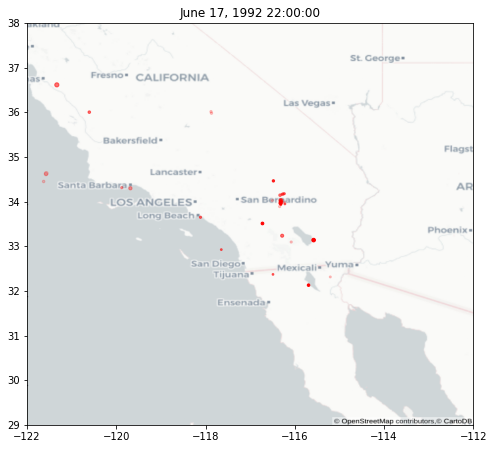

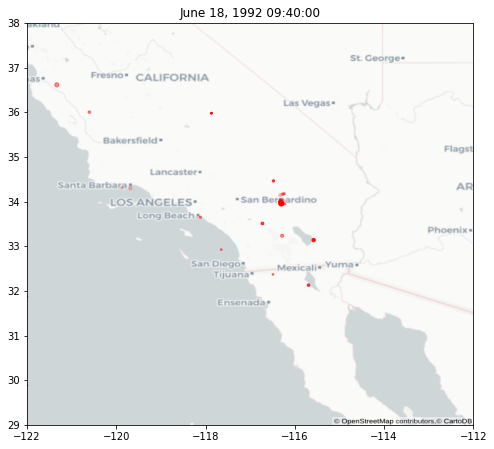

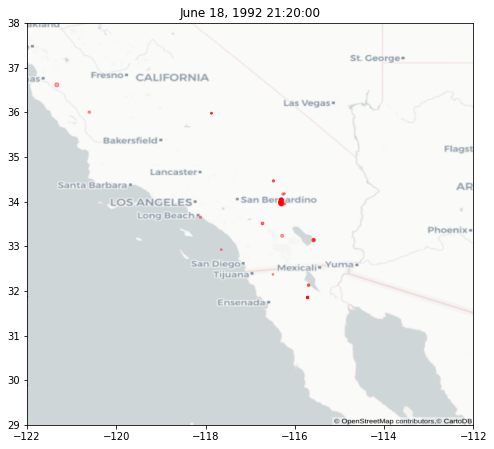

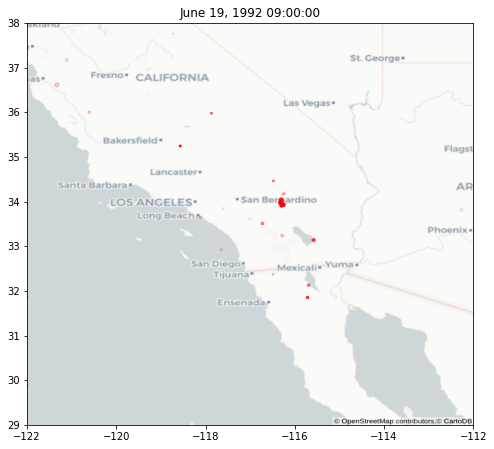

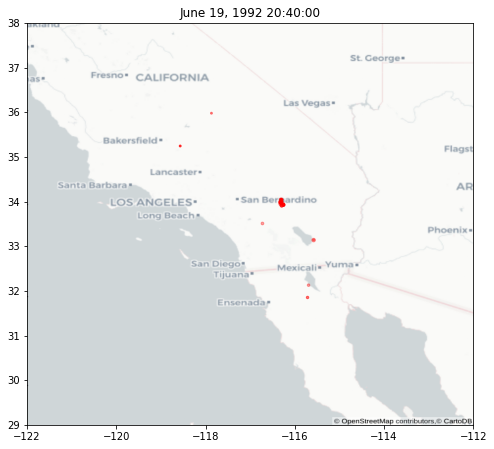

...

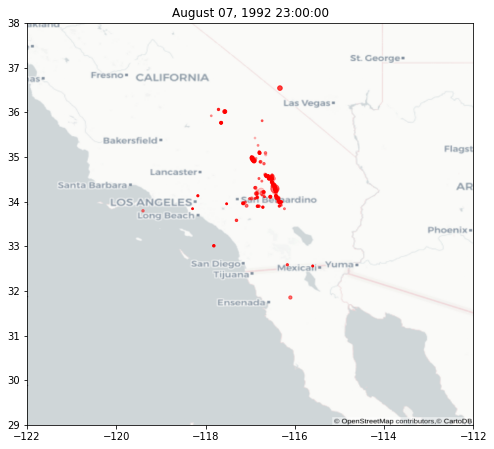

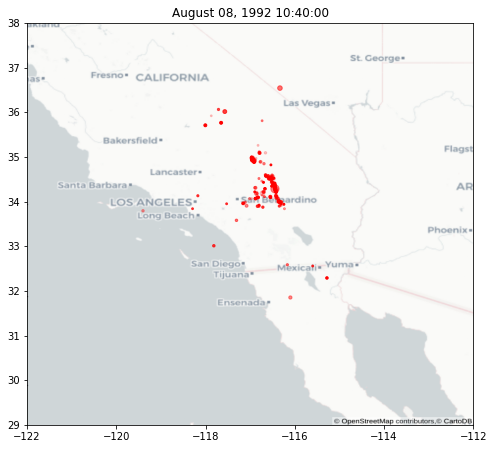

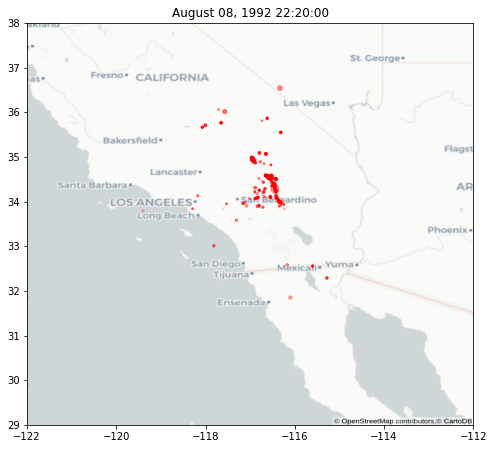

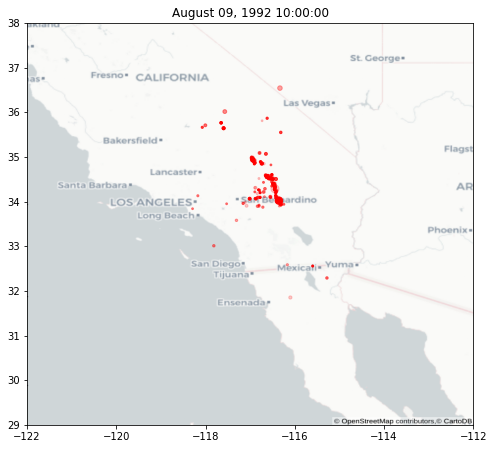

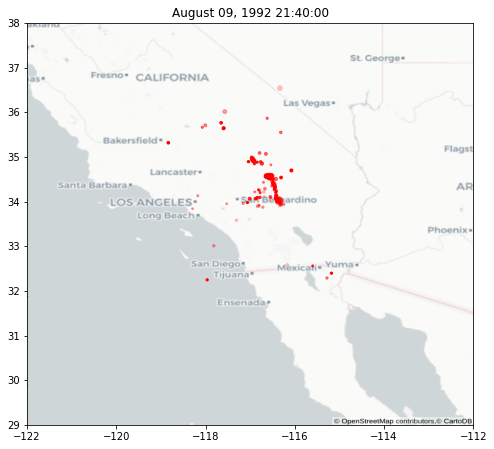

In [15]:
#per poter convertire i secondi del dataset in una data
T0 = datetime.datetime(1982, 1, 1, 0, 0)
delta_T = (T0 -datetime.datetime(1970,1,1)).total_seconds()


#dati che servono e lista dei frame
files = []

T = np.array(df["t"].tolist())
M = np.array(df["mag"].tolist())
X = np.array(df["x"].tolist())
Y = np.array(df["y"].tolist())
Z = np.array(df["z"].tolist())
size = len(T)

#questi sono parametri da cambiare per far si che nel ciclo for il programma non legga tutti gli eventi, 
#ma solo quelli nel range d'interesse
index_min = 0
index_max = size

#con questi parametri si vedono le foreshocks avvenute dal 22 aprile 1992
#step_0 = 8115
#steps = 60
#dt = 40000
#index_min = 36000
#index_max = 40000

#con questi parametri si vede il terremoto del 28 giugno 1992 
step_0 = 7860
steps = 110
dt = 42000
index_min = 36000
index_max = 51000

for step in range(step_0,step_0 +steps):
    x_points = []
    y_points = []
    size_points = []
    alpha_points = []
    
    events = 0

    #visto che non si guarda tutto il dataset non ciclo su tutti gli eventi, cosi si guadagna molto tempo
    for i in range(index_min, index_max,1):
    
        #in base a quando e' stato registrato l'evento lo si "registra", anche se avvenuto un po' nel passato
        if(T[i]>(step-5)*dt and T[i]<(step+1)*dt):
            r,lat,long = cartesian_to_spherical(X[i],Y[i],Z[i])
            x_points.append(long)
            y_points.append(lat)
            #per far vedere meglio i terremoti potenti
            size_points.append((M[i]-0.5)**3)
            events = events + 1 
            
            # in base a quanto effettivamente l'evento si trova nel passato si associa il valore di alpha
            if(T[i]>(step-5)*dt and T[i]<(step-4)*dt):     alpha_points.append(0.2)
            elif(T[i]>(step-4)*dt and T[i]<(step-3)*dt):   alpha_points.append(0.35)
            elif(T[i]>(step-3)*dt and T[i]<(step-2)*dt):   alpha_points.append(0.45)
            elif(T[i]>(step-2)*dt and T[i]<(step-1)*dt):   alpha_points.append(0.55)
            elif(T[i]>(step-1)*dt and T[i]<(step)*dt):     alpha_points.append(0.75)
            elif(T[i]>(step)*dt and T[i]<(step+1)*dt):     alpha_points.append(1)
         
    #codice per implementare il vettore delle alpha
    rgba_colors = np.zeros((events,4))
    # for red the first column needs to be one
    rgba_colors[:,0] = 1.0
    # the fourth column needs to be your alphas
    rgba_colors[:, 3] = alpha_points

    #aggiungere background
    img = plt.imread("gif_background.png")
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img, extent=[-122, -112, 29, 38])

    #si plottano punti
    ax.scatter(x=x_points,y=y_points,s=size_points,color=rgba_colors)
    name = str(step) + ".png"
    title = datetime.datetime.fromtimestamp(delta_T+step*dt).strftime("%B %d, %Y %H:%M:%S")
    ax.set_title(title)
    ax.set_xlim(-122,  -112)
    ax.set_ylim(29, 38)
    fig.savefig(name)
    #cancello l'immagine
    plt.clf()
    plt.close()
    
    #per fare andare la gif piu lenta basta fare tanti append, cioe' aggiungere frame uguali
    files.append(name)
    files.append(name)
    
with imageio.get_writer('June_1992_earthquake.gif', mode='I') as writer:
    for filename in files:
        image = imageio.imread(filename)
        writer.append_data(image) 
    
#remove files
for file in set(files):
    os.remove(file)